USA HOUSE PRICES

import library

In [57]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [58]:
# membaca data
df_house = pd.read_csv("USA Housing Dataset.csv")
print(df_house)

                     date         price  bedrooms  bathrooms  sqft_living  \
0     2014-05-09 00:00:00  3.760000e+05       3.0       2.00         1340   
1     2014-05-09 00:00:00  8.000000e+05       4.0       3.25         3540   
2     2014-05-09 00:00:00  2.238888e+06       5.0       6.50         7270   
3     2014-05-09 00:00:00  3.240000e+05       3.0       2.25          998   
4     2014-05-10 00:00:00  5.499000e+05       5.0       2.75         3060   
...                   ...           ...       ...        ...          ...   
4135  2014-07-09 00:00:00  3.081667e+05       3.0       1.75         1510   
4136  2014-07-09 00:00:00  5.343333e+05       3.0       2.50         1460   
4137  2014-07-09 00:00:00  4.169042e+05       3.0       2.50         3010   
4138  2014-07-10 00:00:00  2.034000e+05       4.0       2.00         2090   
4139  2014-07-10 00:00:00  2.206000e+05       3.0       2.50         1490   

      sqft_lot  floors  waterfront  view  condition  sqft_above  \
0       

In [59]:
# menganalisis data 
df_house.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4140 entries, 0 to 4139
Data columns (total 18 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   date           4140 non-null   object 
 1   price          4140 non-null   float64
 2   bedrooms       4140 non-null   float64
 3   bathrooms      4140 non-null   float64
 4   sqft_living    4140 non-null   int64  
 5   sqft_lot       4140 non-null   int64  
 6   floors         4140 non-null   float64
 7   waterfront     4140 non-null   int64  
 8   view           4140 non-null   int64  
 9   condition      4140 non-null   int64  
 10  sqft_above     4140 non-null   int64  
 11  sqft_basement  4140 non-null   int64  
 12  yr_built       4140 non-null   int64  
 13  yr_renovated   4140 non-null   int64  
 14  street         4140 non-null   object 
 15  city           4140 non-null   object 
 16  statezip       4140 non-null   object 
 17  country        4140 non-null   object 
dtypes: float

terdapat kejanggalan di kolom bedrooms dan floors

In [60]:
df_house[["bedrooms", "floors", ]] = df_house[["bedrooms", "floors"]].astype(int)

maka itu aku coba ganti ke kolom int

In [61]:
df_house.info() # mengecek ulang data

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4140 entries, 0 to 4139
Data columns (total 18 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   date           4140 non-null   object 
 1   price          4140 non-null   float64
 2   bedrooms       4140 non-null   int32  
 3   bathrooms      4140 non-null   float64
 4   sqft_living    4140 non-null   int64  
 5   sqft_lot       4140 non-null   int64  
 6   floors         4140 non-null   int32  
 7   waterfront     4140 non-null   int64  
 8   view           4140 non-null   int64  
 9   condition      4140 non-null   int64  
 10  sqft_above     4140 non-null   int64  
 11  sqft_basement  4140 non-null   int64  
 12  yr_built       4140 non-null   int64  
 13  yr_renovated   4140 non-null   int64  
 14  street         4140 non-null   object 
 15  city           4140 non-null   object 
 16  statezip       4140 non-null   object 
 17  country        4140 non-null   object 
dtypes: float

In [62]:

# memisahkan data khusus object
object_columns = df_house.select_dtypes('object').columns
print(object_columns)

Index(['date', 'street', 'city', 'statezip', 'country'], dtype='object')


In [63]:
int_columns = df_house.select_dtypes('int').columns
print(int_columns) # memisahkan data khusus int

Index(['bedrooms', 'sqft_living', 'sqft_lot', 'floors', 'waterfront', 'view',
       'condition', 'sqft_above', 'sqft_basement', 'yr_built', 'yr_renovated'],
      dtype='object')


In [64]:
float_columns = df_house.select_dtypes('float').columns.tolist()
print(float_columns) # memisahkan data khusus float

['price', 'bathrooms']


In [65]:
ordinal_columns = df_house.select_dtypes('object').columns.tolist()
print(ordinal_columns)

['date', 'street', 'city', 'statezip', 'country']


missing value

In [66]:
# mencari missinf value dan memfilternya
df_house.isnull().sum()[df_house.isnull().sum() > 0]

Series([], dtype: int64)

perlu di perhatikan bahwa nggak semua nilai NaN atau nilai 0 itu missing value, bisa saja data dari perusahaanya memang 0 jadi nggak usah dihapus daripada kehilangan banyak data.

In [67]:
# kolom dengan nilai 0
columns_dengan_nilai_0 = {"wsaterFront", "view"}

# print columns_dengan_nilai_0
print(f"kolom dengan nilai 0 adalah : {len(columns_dengan_nilai_0)}")

kolom dengan nilai 0 adalah : 2


In [68]:
# copy buat backup data 
df_house = df_house.copy()

oke overall datanya sudah bagus dan bersih

In [ ]:
house_price_merge = pd.merge(df_house, how="right").copy()
house_price_merge

,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,sqft_above,sqft_basement,yr_built,yr_renovated,street,city,statezip,country
0,2014-05-09 00:00:00,3.760000e+05,3,2.00,1340,1384,3,0,0,3,1340,0,2008,0,9245-9249 Fremont Ave N,Seattle,WA 98103,USA
1,2014-05-09 00:00:00,8.000000e+05,4,3.25,3540,159430,2,0,0,3,3540,0,2007,0,33001 NE 24th St,Carnation,WA 98014,USA
2,2014-05-09 00:00:00,2.238888e+06,5,6.50,7270,130017,2,0,0,3,6420,850,2010,0,7070 270th Pl SE,Issaquah,WA 98029,USA
3,2014-05-09 00:00:00,3.240000e+05,3,2.25,998,904,2,0,0,3,798,200,2007,0,820 NW 95th St,Seattle,WA 98117,USA
4,2014-05-10 00:00:00,5.499000e+05,5,2.75,3060,7015,1,0,0,5,1600,1460,1979,0,10834 31st Ave SW,Seattle,WA 98146,USA
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4135,2014-07-09 00:00:00,3.081667e+05,3,1.75,1510,6360,1,0,0,4,1510,0,1954,1979,501 N 143rd St,Seattle,WA 98133,USA
4136,2014-07-09 00:00:00,5.343333e+05,3,2.50,1460,7573,2,0,0,3,1460,0,1983,2009,14855 SE 10th Pl,Bellevue,WA 98007,USA
4137,2014-07-09 00:00:00,4.169042e+05,3,2.50,3010,7014,2,0,0,3,3010,0,2009,0,759 Ilwaco Pl NE,Renton,WA 98059,USA
4138,2014-07-10 00:00:00,2.034000e+05,4,2.00,2090,6630,1,0,0,3,1070,1020,1974,0,5148 S Creston St,Seattle,WA 98178,USA


In [70]:
# mengecek count waterfront
house_price_merge.waterfront.describe()

count    4140.000000
mean        0.007488
std         0.086219
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         1.000000
Name: waterfront, dtype: float64

In [71]:
# mengecek count view
house_price_merge.view.describe()

count    4140.000000
mean        0.246618
std         0.790619
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         4.000000
Name: view, dtype: float64

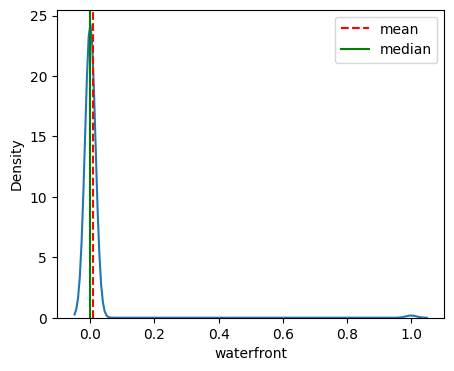

In [72]:
# mengatur ukuran plt figure 
plt.figure(figsize=(5, 4))

# menggunakan visualisasi kdplot
sns.kdeplot(data=house_price_merge, x = "waterfront")

# garis vertikal untuk mean
plt.axvline(x=house_price_merge.waterfront.mean(), color="r", linestyle = "--", label="mean")

# garis vertikal untuk median
plt.axvline(x=house_price_merge.waterfront.median(), color="g", linestyle="-", label="median")

# unuk menampilkan warna garis
plt.legend()

# untuk menampilkan grafik
plt.show()

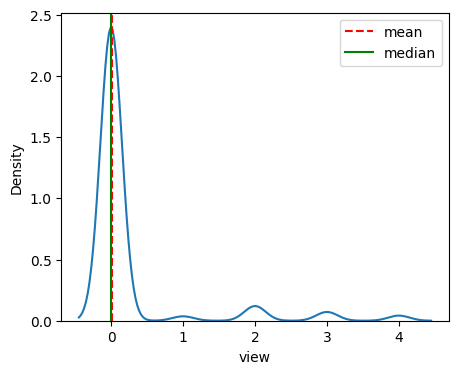

In [73]:
# mengatur ukuran plt figure 
plt.figure(figsize=(5, 4))

# menggunakan visualisasi kdplot
sns.kdeplot(data=house_price_merge, x = "view")

# garis vertikal untuk mean
plt.axvline(x=house_price_merge.waterfront.mean(), color="r", linestyle = "--", label="mean")

# garis vertikal untuk median
plt.axvline(x=house_price_merge.waterfront.median(), color="g", linestyle="-", label="median")

# unuk menampilkan warna garis
plt.legend()

# untuk menampilkan grafik
plt.show()

handle outlier 

mendeteksi outlier menggunakan IQR 

In [74]:
# fungsi deteksi outlier
def deteksi_outliers_iqr(data):
 
 # inisialisasi list yang berisi outlier
 outliers = []
 
 # sort data values
 data = sorted(data)
 
 # menghitung Q1
 q1 = np.percentile(data, 25)
 
 # menghitung Q3 
 q3 = np.percentile(data, 75)
 
 # menghitung IQR
 IQR = q1-q3
 
 # mengatur lower bound
 # catatan: kita bisa bermain dengan value 1.5 untuk melebar atau menyempit
 lwr_bound = q1-(1.5*IQR)
 
 # mengatur upper bound
 # catatan: kita bisa bermain dengan value 1.5 untuk melebar atau menyempit
 upr_bound = q1-(1.5*IQR)
 
 # print perhitungan lower dan upper bound kolom tertentu
 print("lower:", lwr_bound, "upper", upr_bound)
 
 # untuk setiap data point, memutuskan lebih baik jika jatuh di lower bound atau di upper bound
 for i in data:
  if (i<lwr_bound or i > upr_bound):
      outliers.append(i)
 return outliers

In [75]:
outlier_columns = ['bedrooms', 'sqft_living', 'sqft_lot', 'floors', 'waterfront', 'view',
       'condition', 'sqft_above', 'sqft_basement', 'yr_built', 'yr_renovated', 'price', 'bathrooms']

In [76]:
for col in outlier_columns:
 
 outlier = deteksi_outliers_iqr(house_price_merge[col])
 
 print("angka outliers di column", f"'{str(col)}'", "is", len(outlier))
 print()

lower: 4.5 upper 4.5
angka outliers di column 'bedrooms' is 4140

lower: 3195.0 upper 3195.0
angka outliers di column 'sqft_living' is 4140

lower: 14000.0 upper 14000.0
angka outliers di column 'sqft_lot' is 4140

lower: 2.5 upper 2.5
angka outliers di column 'floors' is 4140

lower: 0.0 upper 0.0
angka outliers di column 'waterfront' is 31

lower: 0.0 upper 0.0
angka outliers di column 'view' is 418

lower: 4.5 upper 4.5
angka outliers di column 'condition' is 4140

lower: 2870.0 upper 2870.0
angka outliers di column 'sqft_above' is 4139

lower: 903.75 upper 903.75
angka outliers di column 'sqft_basement' is 4140

lower: 2020.0 upper 2020.0
angka outliers di column 'yr_built' is 4140

lower: 2998.5 upper 2998.5
angka outliers di column 'yr_renovated' is 4140

lower: 828687.5 upper 828687.5
angka outliers di column 'price' is 4140

lower: 2.875 upper 2.875
angka outliers di column 'bathrooms' is 4140



In [77]:
outlier_columns = [out for out in outlier_columns if out not in ['waterfront', 'view' ]]
outlier_columns

['bedrooms',
 'sqft_living',
 'sqft_lot',
 'floors',
 'condition',
 'sqft_above',
 'sqft_basement',
 'yr_built',
 'yr_renovated',
 'price',
 'bathrooms']

In [78]:
house_price_merge.shape

(4140, 18)

In [79]:
# melakukan import copy 
import copy 

# melakukan copy data original
house_price_capped = copy.deepcopy(house_price_merge)

In [80]:
# membuat fungsi untuk filter outlier
def capping_outlier(col):
 
 # mendefinisikan batas atas dan bawah outlier
 lwr_limit = house_price_merge[col].quantile(0.03)
 upr_limit = house_price_merge[col].quantile(0.97)
 
 print(str(col).upper())
 print("lwr:", lwr_limit, "upr:", upr_limit)
 print()
 
 # melakukan filter outlier
 house_price_capped[col] = np.where(house_price_capped[col] > upr_limit, upr_limit,
                                     np.where(house_price_capped[col] < lwr_limit, lwr_limit, house_price_capped[col]))

In [81]:
for col in outlier_columns:
 capping_outlier(col)

BEDROOMS
lwr: 2.0 upr: 5.0

SQFT_LIVING
lwr: 860.0 upr: 4306.5999999999985

SQFT_LOT
lwr: 1330.51 upr: 60330.499999999985

FLOORS
lwr: 1.0 upr: 2.0

CONDITION
lwr: 3.0 upr: 5.0

SQFT_ABOVE
lwr: 800.0 upr: 3840.0

SQFT_BASEMENT
lwr: 0.0 upr: 1370.0

YR_BUILT
lwr: 1909.0 upr: 2012.0

YR_RENOVATED
lwr: 0.0 upr: 2012.0

PRICE
lwr: 165000.0 upr: 1384830.0

BATHROOMS
lwr: 1.0 upr: 3.75



In [82]:
house_price_merge.shape

(4140, 18)

Feature Engineering

One-Hot encoding untuk data yang tidak ada urutanya atau tidak ada data yang ordinal

In [83]:
from sklearn.preprocessing import OneHotEncoder, StandardScaler # import library
ohe = OneHotEncoder(handle_unknown ='ignore') # fungsi ignore = ketika model model sudah dilatih terus kita mau mengubah nama colomns tidak akan terjadi eror ketika kita jalankan 

In [84]:
# copy dataset
house_price_ohe = copy.deepcopy(house_price_capped)

# latih OHE ke categocrical columns
ohe.fit(house_price_ohe[object_columns])

OneHotEncoder(handle_unknown='ignore')

In [85]:
# transform ohe [object_columns] ke biner 0, 1
ohe_cat = ohe.transform(house_price_ohe[object_columns])

In [86]:
# ohe cat dijadikan array, terus kita memanggil ohe.get_feature_names_out
ohe_cat = pd.DataFrame(ohe_cat.toarray(), columns =ohe.get_feature_names_out())
ohe_cat

,date_2014-05-02 00:00:00,date_2014-05-05 00:00:00,date_2014-05-06 00:00:00,date_2014-05-07 00:00:00,date_2014-05-08 00:00:00,date_2014-05-09 00:00:00,date_2014-05-10 00:00:00,date_2014-05-11 00:00:00,date_2014-05-12 00:00:00,date_2014-05-13 00:00:00,...,statezip_WA 98166,statezip_WA 98168,statezip_WA 98177,statezip_WA 98178,statezip_WA 98188,statezip_WA 98198,statezip_WA 98199,statezip_WA 98288,statezip_WA 98354,country_USA
0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
1,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
2,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
3,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
4,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4135,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
4136,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
4137,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
4138,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0


In [87]:
ohe.get_feature_names_out()

array(['date_2014-05-02 00:00:00', 'date_2014-05-05 00:00:00',
       'date_2014-05-06 00:00:00', ..., 'statezip_WA 98288',
       'statezip_WA 98354', 'country_USA'], dtype=object)

In [88]:
# join ohe columns ke original dataset 
house_price_ohe = house_price_ohe.join(ohe_cat)
house_price_ohe

,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,...,statezip_WA 98166,statezip_WA 98168,statezip_WA 98177,statezip_WA 98178,statezip_WA 98188,statezip_WA 98198,statezip_WA 98199,statezip_WA 98288,statezip_WA 98354,country_USA
0,2014-05-09 00:00:00,3.760000e+05,3.0,2.00,1340.0,1384.00,2.0,0,0,3.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
1,2014-05-09 00:00:00,8.000000e+05,4.0,3.25,3540.0,60330.50,2.0,0,0,3.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
2,2014-05-09 00:00:00,1.384830e+06,5.0,3.75,4306.6,60330.50,2.0,0,0,3.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
3,2014-05-09 00:00:00,3.240000e+05,3.0,2.25,998.0,1330.51,2.0,0,0,3.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
4,2014-05-10 00:00:00,5.499000e+05,5.0,2.75,3060.0,7015.00,1.0,0,0,5.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4135,2014-07-09 00:00:00,3.081667e+05,3.0,1.75,1510.0,6360.00,1.0,0,0,4.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
4136,2014-07-09 00:00:00,5.343333e+05,3.0,2.50,1460.0,7573.00,2.0,0,0,3.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
4137,2014-07-09 00:00:00,4.169042e+05,3.0,2.50,3010.0,7014.00,2.0,0,0,3.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
4138,2014-07-10 00:00:00,2.034000e+05,4.0,2.00,2090.0,6630.00,1.0,0,0,3.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0


In [89]:
# drop columns yang tidak di encoded
house_price_ohe.drop(object_columns, axis=1, inplace=True)
house_price_ohe

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,sqft_above,...,statezip_WA 98166,statezip_WA 98168,statezip_WA 98177,statezip_WA 98178,statezip_WA 98188,statezip_WA 98198,statezip_WA 98199,statezip_WA 98288,statezip_WA 98354,country_USA
0,3.760000e+05,3.0,2.00,1340.0,1384.00,2.0,0,0,3.0,1340.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
1,8.000000e+05,4.0,3.25,3540.0,60330.50,2.0,0,0,3.0,3540.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
2,1.384830e+06,5.0,3.75,4306.6,60330.50,2.0,0,0,3.0,3840.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
3,3.240000e+05,3.0,2.25,998.0,1330.51,2.0,0,0,3.0,800.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
4,5.499000e+05,5.0,2.75,3060.0,7015.00,1.0,0,0,5.0,1600.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4135,3.081667e+05,3.0,1.75,1510.0,6360.00,1.0,0,0,4.0,1510.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
4136,5.343333e+05,3.0,2.50,1460.0,7573.00,2.0,0,0,3.0,1460.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
4137,4.169042e+05,3.0,2.50,3010.0,7014.00,2.0,0,0,3.0,3010.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
4138,2.034000e+05,4.0,2.00,2090.0,6630.00,1.0,0,0,3.0,1070.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0


jadi dengan metode one hot encoding dia akan menambah column baru yang menjadi kelemahanya karena berpotensi menyebabkan ledakan dimensi karena terlalu banyak data

modeling

In [92]:
house_price_ohe

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,sqft_above,...,statezip_WA 98166,statezip_WA 98168,statezip_WA 98177,statezip_WA 98178,statezip_WA 98188,statezip_WA 98198,statezip_WA 98199,statezip_WA 98288,statezip_WA 98354,country_USA
0,3.760000e+05,3.0,2.00,1340.0,1384.00,2.0,0,0,3.0,1340.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
1,8.000000e+05,4.0,3.25,3540.0,60330.50,2.0,0,0,3.0,3540.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
2,1.384830e+06,5.0,3.75,4306.6,60330.50,2.0,0,0,3.0,3840.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
3,3.240000e+05,3.0,2.25,998.0,1330.51,2.0,0,0,3.0,800.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
4,5.499000e+05,5.0,2.75,3060.0,7015.00,1.0,0,0,5.0,1600.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4135,3.081667e+05,3.0,1.75,1510.0,6360.00,1.0,0,0,4.0,1510.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
4136,5.343333e+05,3.0,2.50,1460.0,7573.00,2.0,0,0,3.0,1460.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
4137,4.169042e+05,3.0,2.50,3010.0,7014.00,2.0,0,0,3.0,3010.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
4138,2.034000e+05,4.0,2.00,2090.0,6630.00,1.0,0,0,3.0,1070.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0


In [93]:
house_price_ohe.shape

(4140, 4281)

In [95]:
len(house_price_ohe.select_dtypes(['int', 'float']).columns)

4281

In [97]:
x = house_price_ohe.drop(['floors', 'view', 'waterfront',  'price'], axis=1)
y = house_price_ohe.price

In [98]:
print(f"shape of Data {x.shape}")
print(f"shape of Data {y.shape}")

shape of Data (4140, 4277)
shape of Data (4140,)


Modeling

kita akan menggunakan regressi karena regressi merupakan model spesialis numerik

In [100]:
from sklearn.ensemble import RandomForestRegressor

In [101]:
rf = RandomForestRegressor()

In [102]:
rf.fit(x, y)

RandomForestRegressor()

In [103]:
y_pred = rf.predict(x)

In [107]:
y_pred - y

0       23853.240476
1       -5936.455000
2      -71005.800000
3        -484.500000
4       56458.600000
            ...     
4135    71456.916667
4136    -6147.000000
4137    38241.241667
4138    64243.770000
4139    12969.142857
Name: price, Length: 4140, dtype: float64

In [106]:
y

0       3.760000e+05
1       8.000000e+05
2       1.384830e+06
3       3.240000e+05
4       5.499000e+05
            ...     
4135    3.081667e+05
4136    5.343333e+05
4137    4.169042e+05
4138    2.034000e+05
4139    2.206000e+05
Name: price, Length: 4140, dtype: float64

In [104]:
from sklearn.metrics import mean_absolute_error, r2_score, mean_squared_error

print("MAE :", mean_absolute_error(y, y_pred))
print("RMSE :", np.sqrt(mean_squared_error(y, y_pred)))
print("R2 :", r2_score(y, y_pred))


MAE : 36169.37605333399
RMSE : 60190.00747478005
R2 : 0.9553363148847235
